Import the image data from dropbox:

In [1]:
!wget https://www.dropbox.com/s/ay5u5aqhrcmash8/_augmentedwaldos.zip?dl=0
!unzip _augmentedwaldos.zip?dl=0 -d _augmentedwaldos

--2018-05-12 07:14:10--  https://www.dropbox.com/s/ay5u5aqhrcmash8/_augmentedwaldos.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.7.1, 2620:100:6016:1::a27d:101
Connecting to www.dropbox.com (www.dropbox.com)|162.125.7.1|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://dl.dropboxusercontent.com/content_link/pwaWoH7v38wvndQLInxDk0pFdF1KciPHmJs8aBl9kBRfmgsLtmVyYWnoZutSGZUO/file [following]
--2018-05-12 07:14:11--  https://dl.dropboxusercontent.com/content_link/pwaWoH7v38wvndQLInxDk0pFdF1KciPHmJs8aBl9kBRfmgsLtmVyYWnoZutSGZUO/file
Resolving dl.dropboxusercontent.com (dl.dropboxusercontent.com)... 162.125.1.6, 2620:100:6016:6::a27d:106
Connecting to dl.dropboxusercontent.com (dl.dropboxusercontent.com)|162.125.1.6|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 242420265 (231M) [application/zip]
Saving to: ‘_augmentedwaldos.zip?dl=0.2’

_augmentedwaldos.zi 100%[===================>] 231.19M  40.2MB/s    in 8.3

Import libraries:

In [0]:
import os
import numpy as np
import matplotlib.pyplot as plt
import random as rand
import cv2
import time
from PIL import Image
from scipy import misc
from sklearn.svm import LinearSVC
from skimage.feature import hog
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

Function to load the data:

In [0]:
def load_data(postraindataloc, negtraindataloc):
  waldo_imgs = []
  nonwaldo_imgs = []
  
  posImgList = os.listdir(postraindataloc)
  negImgList = os.listdir(negtraindataloc)
  
  for image in posImgList:
    waldo_imgs.append(misc.imread(postraindataloc+image))
  
  for image in negImgList:
    nonwaldo_imgs.append(misc.imread(negtraindataloc+image))
  
  return waldo_imgs, nonwaldo_imgs


Function to compute Histogram of Oriented Gradients for all 3 color channels:

In [0]:
# Compute HOG for a single color channel
def hog_single_channel(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
  if vis:
    # return both hog features and hog image
    features, hog_img = hog(img, orientations=orient,
      pixels_per_cell=(pix_per_cell, pix_per_cell),
      cells_per_block=(cell_per_block, cell_per_block),
      block_norm='L2',
      transform_sqrt=False,
      visualise=True,
      feature_vector=feature_vec)
    return features, hog_img
  else:
    # return hog features
    features = hog(img, orientations=orient,
      pixels_per_cell=(pix_per_cell, pix_per_cell),
      cells_per_block=(cell_per_block, cell_per_block),
      block_norm='L2',
      transform_sqrt=False,
      visualise=False,
      feature_vector=feature_vec)
    return features

# Computes HOG for all 3 color channels of an image
def hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
  if vis:
    # return hog features and hog image
    features = []
    hog_imgs = []
    for channel in range(img.shape[2]):
      feature, hog_img = hog_single_channel(img[:, :, channel], orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, vis=True, feature_vec=True)
      features.append(feature)
      hog_imgs.append(hog_img)

    return features, hog_imgs
  else:
    # return hog features only
    features = []
    for channel in range(img.shape[2]):
      features.append(hog_single_channel(img[:, :, channel], orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, vis=False, feature_vec=True))

    return features

Try fitting the data by first computing HOG and passing features to SVM:

In [19]:
# load 64x64 image data
waldo_imgs, nonwaldo_imgs = load_data('_augmentedwaldos/_augmented waldos/64x64/waldo/', '_augmentedwaldos/_augmented waldos/64x64/notwaldo/')

waldo_features = []
nonwaldo_features = []

# extract HOG features
for img in waldo_imgs:
  waldo_features.append(np.ravel(hog_features(img, 9, 8, 2)))
for img in nonwaldo_imgs:
  nonwaldo_features.append(np.ravel(hog_features(img, 9, 8, 2)))

# print number of features
print("Number of features: " + str(waldo_features[0].shape[0]))
  
# assemble features with ground truth; tried scaling features but it produced poorer results
unscaled_x = np.vstack((waldo_features, nonwaldo_features)).astype(np.float64)
#scaler = StandardScaler().fit(unscaled_x)
#x = scaler.transform(unscaled_x)
y = np.hstack((np.ones(len(waldo_imgs)), np.zeros(len(nonwaldo_imgs))))

# train HOG features
x_train, x_test, y_train, y_test = train_test_split(unscaled_x, y, test_size = 0.2, random_state = rand.randint(1, 100))
svc = LinearSVC()
t1 = time.time()
svc.fit(x_train, y_train)
t2 = time.time()
training_time = t2-t1
# print training time
print(str(training_time) + " seconds")

Number of features: 5292
8.087979078292847 seconds


In [20]:
# retrieve accuracy values
accuracy_train = svc.score(x_train, y_train)
accuracy_validation = svc.score(x_test, y_test)

print("training accuracy: " + str(accuracy_train))
print("validation accuracy: " + str(accuracy_validation))

training accuracy: 1.0
validation accuracy: 0.9785522788203753


Try model on 10 random samples:

[1. 0. 0. 1. 1. 0. 0. 1. 0. 0.]
waldo image #8
prediction: waldo


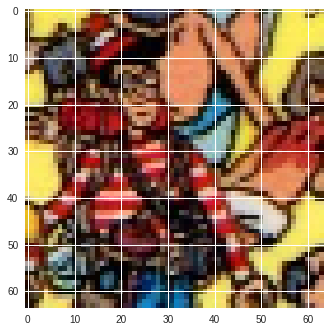

non-waldo image #3704
prediction: not waldo


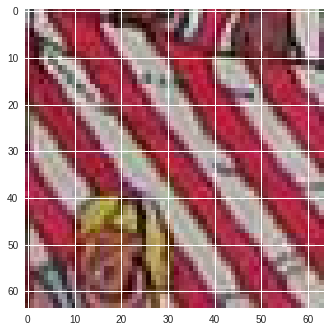

non-waldo image #3634
prediction: not waldo


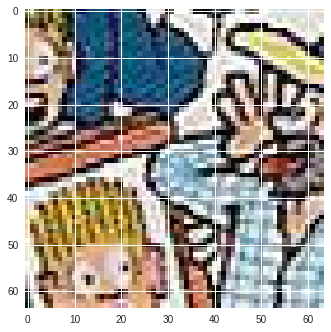

waldo image #12
prediction: waldo


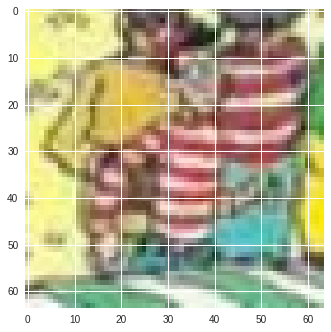

waldo image #100
prediction: waldo


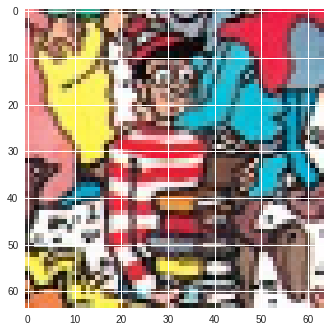

non-waldo image #3099
prediction: not waldo


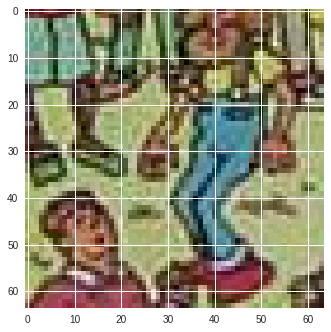

non-waldo image #1772
prediction: not waldo


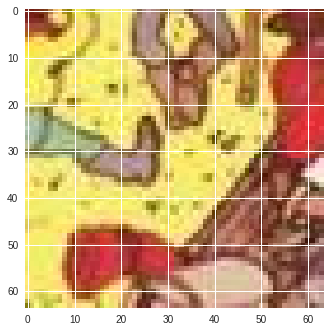

waldo image #76
prediction: waldo


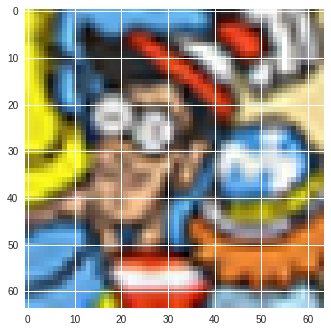

waldo image #111
prediction: not waldo


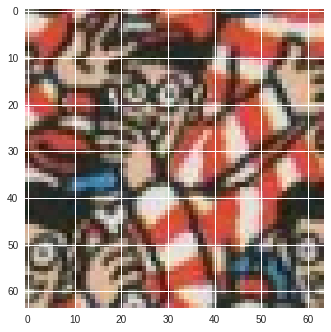

non-waldo image #1796
prediction: not waldo


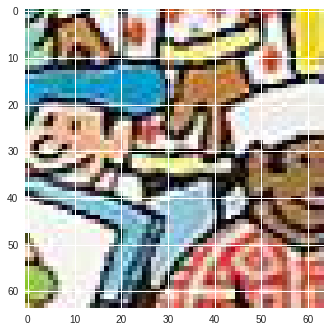

In [22]:
# test classifier on 10 random samples of 5 waldo, 5 not waldo
rand_waldos = rand.sample(range(0, len(waldo_imgs)), 5)
rand_nonwaldos = rand.sample(range(0, len(nonwaldo_imgs)), 5)

f1 = np.ravel(hog_features(waldo_imgs[rand_waldos[0]], 9, 8, 2))
f2 = np.ravel(hog_features(nonwaldo_imgs[rand_nonwaldos[0]], 9, 8, 2))
f3 = np.ravel(hog_features(nonwaldo_imgs[rand_nonwaldos[1]], 9, 8, 2))
f4 = np.ravel(hog_features(waldo_imgs[rand_waldos[1]], 9, 8, 2))
f5 = np.ravel(hog_features(waldo_imgs[rand_waldos[2]], 9, 8, 2))
f6 = np.ravel(hog_features(nonwaldo_imgs[rand_nonwaldos[2]], 9, 8, 2))
f7 = np.ravel(hog_features(nonwaldo_imgs[rand_nonwaldos[3]], 9, 8, 2))
f8 = np.ravel(hog_features(waldo_imgs[rand_waldos[3]], 9, 8, 2))
f9 = np.ravel(hog_features(waldo_imgs[rand_waldos[4]], 9, 8, 2))
f10 = np.ravel(hog_features(nonwaldo_imgs[rand_nonwaldos[4]], 9, 8, 2))

#f = scaler.transform([f1, f2, f3, f4, f5, f6, f7, f8, f9, f10])
result = svc.predict([f1, f2, f3, f4, f5, f6, f7, f8, f9, f10])

print(result)

print("waldo image #" + str(rand_waldos[0]))
print("prediction: " + ("waldo" if result[0] == 1 else "not waldo"))
plt.imshow(waldo_imgs[rand_waldos[0]])
plt.show()
print("non-waldo image #" + str(rand_nonwaldos[0]))
print("prediction: " + ("waldo" if result[1] == 1 else "not waldo"))
plt.imshow(nonwaldo_imgs[rand_nonwaldos[0]])
plt.show()
print("non-waldo image #" + str(rand_nonwaldos[1]))
print("prediction: " + ("waldo" if result[2] == 1 else "not waldo"))
plt.imshow(nonwaldo_imgs[rand_nonwaldos[1]])
plt.show()
print("waldo image #" + str(rand_waldos[1]))
print("prediction: " + ("waldo" if result[3] == 1 else "not waldo"))
plt.imshow(waldo_imgs[rand_waldos[1]])
plt.show()
print("waldo image #" + str(rand_waldos[2]))
print("prediction: " + ("waldo" if result[4] == 1 else "not waldo"))
plt.imshow(waldo_imgs[rand_waldos[2]])
plt.show()
print("non-waldo image #" + str(rand_nonwaldos[2]))
print("prediction: " + ("waldo" if result[5] == 1 else "not waldo"))
plt.imshow(nonwaldo_imgs[rand_nonwaldos[2]])
plt.show()
print("non-waldo image #" + str(rand_nonwaldos[3]))
print("prediction: " + ("waldo" if result[6] == 1 else "not waldo"))
plt.imshow(nonwaldo_imgs[rand_nonwaldos[3]])
plt.show()
print("waldo image #" + str(rand_waldos[3]))
print("prediction: " + ("waldo" if result[7] == 1 else "not waldo"))
plt.imshow(waldo_imgs[rand_waldos[3]])
plt.show()
print("waldo image #" + str(rand_waldos[4]))
print("prediction: " + ("waldo" if result[8] == 1 else "not waldo"))
plt.imshow(waldo_imgs[rand_waldos[4]])
plt.show()
print("non-waldo image #" + str(rand_nonwaldos[4]))
print("prediction: " + ("waldo" if result[9] == 1 else "not waldo"))
plt.imshow(nonwaldo_imgs[rand_nonwaldos[4]])
plt.show()

Now to try model on full-sized image:

In [0]:
def find_waldo(img_loc, step_sz, window_sz):
  jpeg_img = Image.open(img_loc)
  width, height = jpeg_img.size
  
  img_file_white = Image.new("RGB", (width, height), "white")
  img_blended = Image.blend(jpeg_img, img_file_white, 0.8)
  
  img_arr = misc.imread(img_loc)
  
  # print image size
  print(str(width) + ", " + str(height))
  
  for x in range(0, img_arr.shape[0] - window_sz , step_sz):
    for y in range(0, img_arr.shape[1] - window_sz, step_sz):
      try:
        window = img_arr[x:x + window_sz, y:y + window_sz, :]    
        window_features = np.ravel(hog_features(window, 9, 8, 2))
        result = svc.predict([window_features])
        
        if(result == 1):
          img_blended.paste(Image.fromarray(window), (y, x))
          #print(str(x) + ", "+ str(y) + "found a waldo")
      except:
        #print("something wrong")
        pass
                        
  return img_blended

2048, 1282


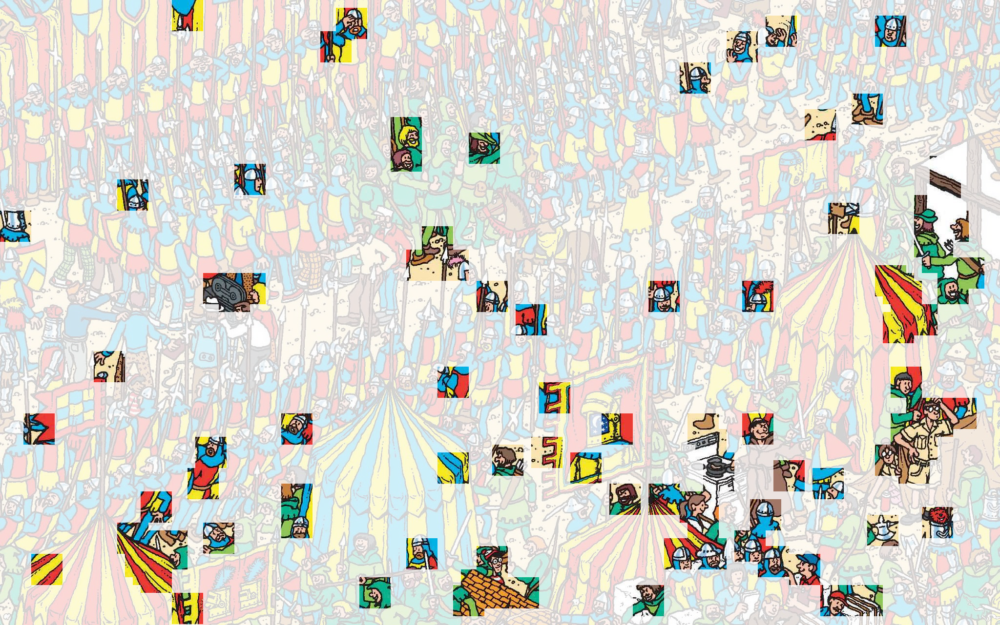

In [23]:
find_waldo('_augmentedwaldos/_augmented waldos/testing/63.jpg', 16, 64)

1944, 1218


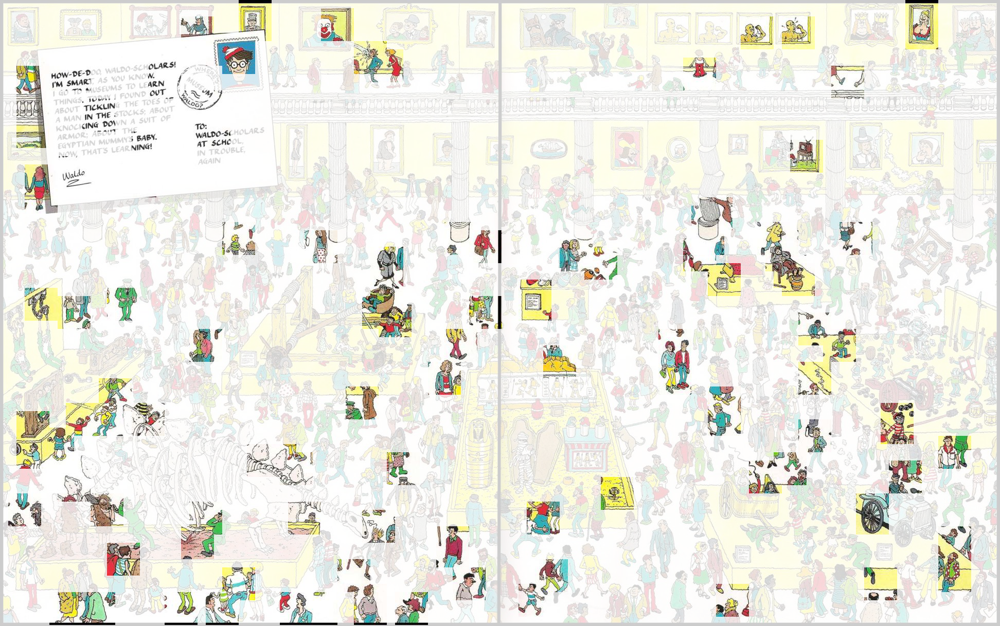

In [26]:
find_waldo('_augmentedwaldos/_augmented waldos/testing/74.jpg', 16, 64)